# Using Spark in AWS

## Lesson Introduction

Lesson Overview

In this lesson, we’ll explore using Spark in AWS with the Amazon Simple Storage Service, or S3

https://www.youtube.com/watch?v=wW4RqZ62i5s

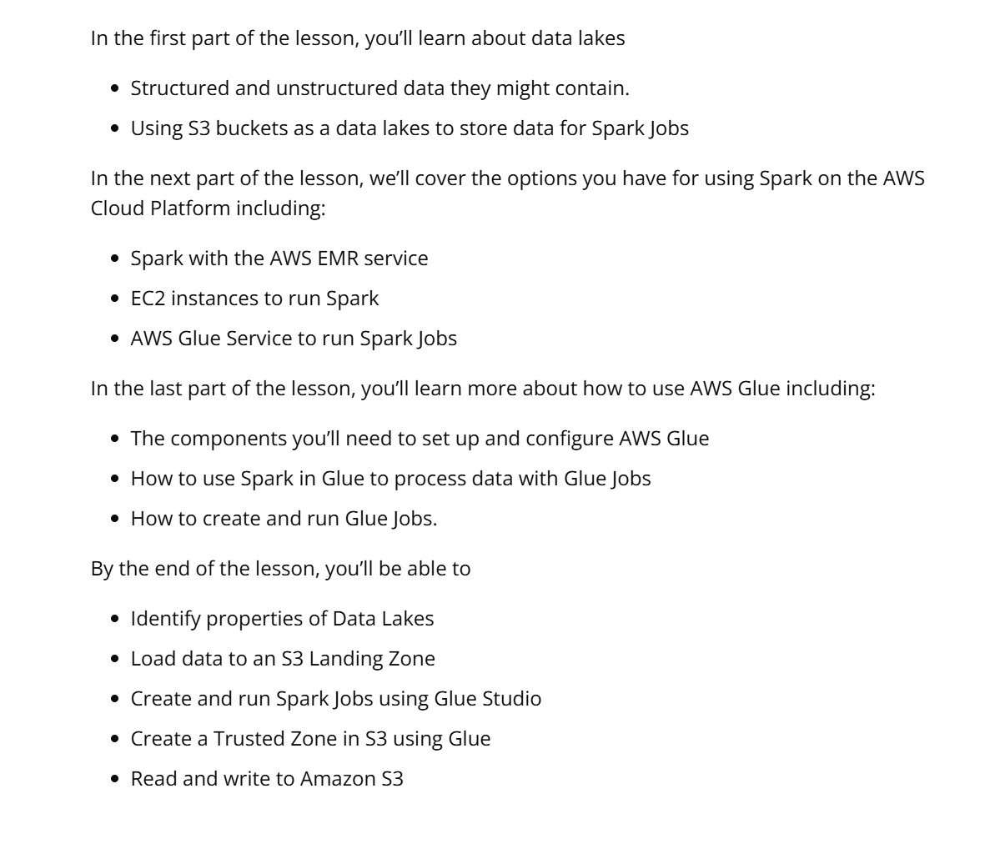

## Data Lakes in AWS

https://www.youtube.com/watch?v=ILTy9vDLY4I

## Data Lakes are Natural
It doesn't have to be called a data lake to be one! Many lakes and other natural features existed for thousands of years without being discovered. But they still existed. Perhaps you are about to discover a data lake you didn't recognize.

A lake is a large body of water. It is usually a naturally occurring feature. If your organization has large amounts of data somewhere, in an unstructured (Text, Multimedia, etc.) or semi-structured format (CSV, JSON, Parquet, and other formats), congratulations! You have a data lake!

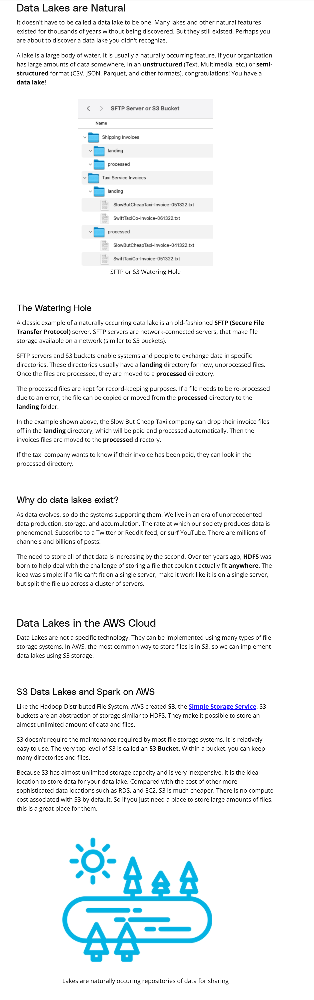

## Using Spark on AWS

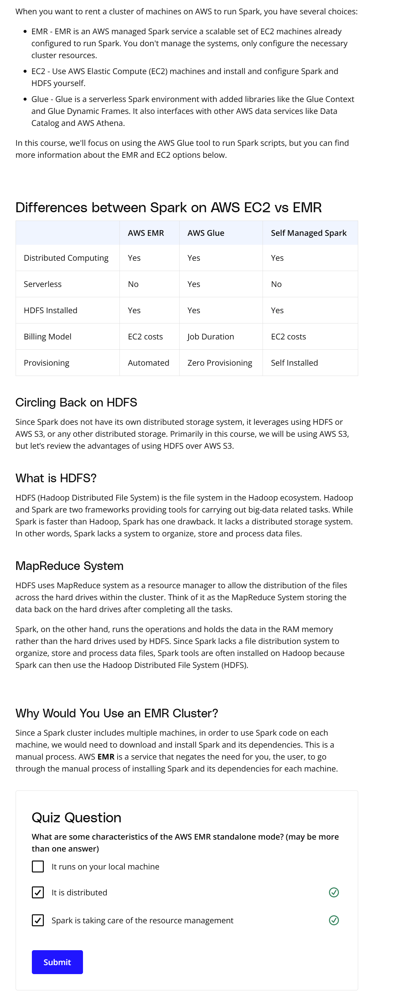

## Introduction to AWS Glue

Glue Studio

We started off by introducing Spark, then RDDs, and then Spark SQL. Spark SQL relies on RDDs, which rely on Spark itself. Similarly, Glue is an AWS Service that relies on Spark. You can use Glue Studio to write purely Spark scripts. We will also go over unique Glue features you can add to your script.

Using AWS Glue to run Spark Jobs requires the following resources and configuration:

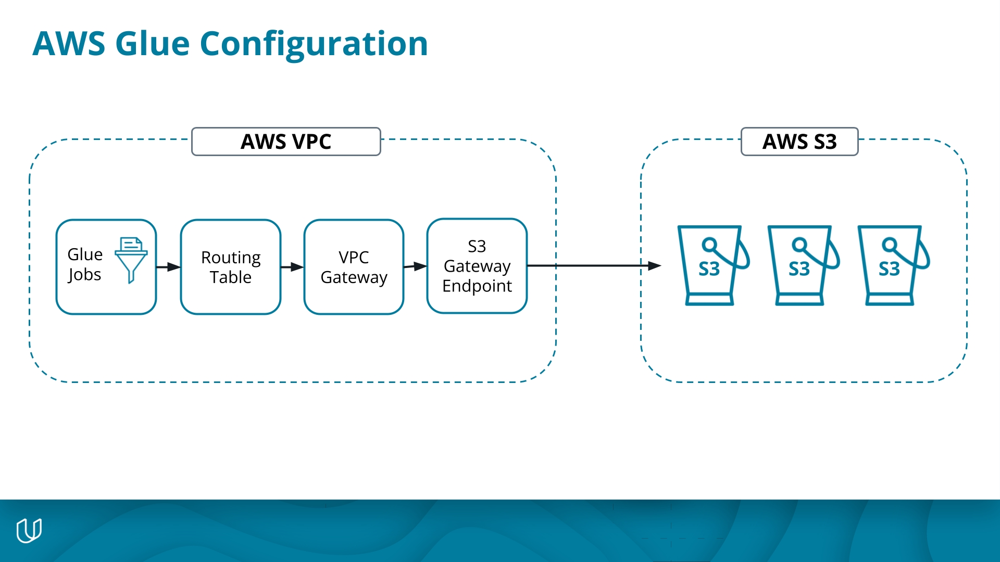

Glue Job Using S3 VPC Gateway

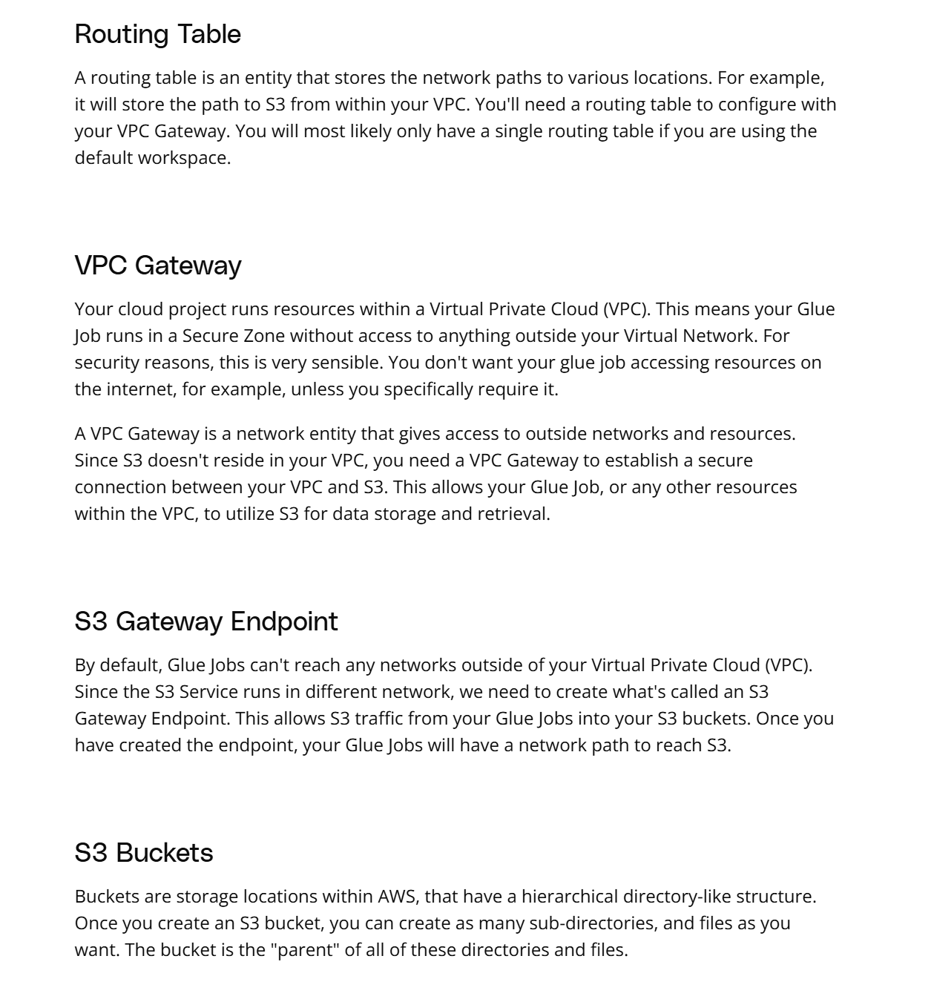

## Configuring the S3 VPC Gateway Endpoint

Step 1: Creating an S3 Bucket

Buckets are storage locations within AWS, that have a hierarchical directory-like structure. Once you create an S3 bucket, you can create as many sub-directories, and files as you want. The bucket is the "parent" of all of these directories and files.

To create an S3 bucket use the aws s3 mb command: aws s3 mb s3://_______ replacing the blank with the name of your bucket. You can also create S3 buckets using the AWS web console.

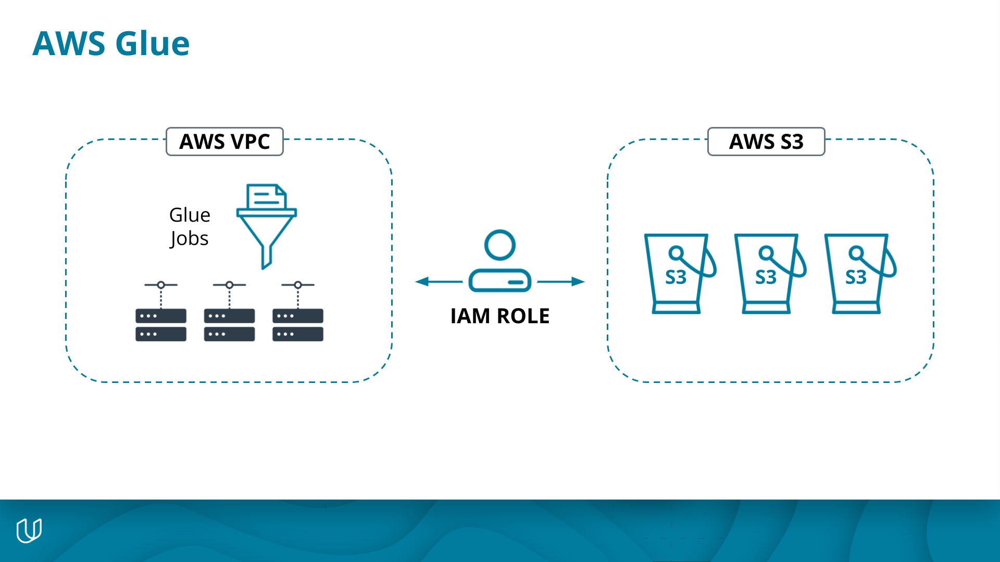

lue Job Using S3 VPC Gateway

## Step 2: S3 Gateway Endpoint
By default, Glue Jobs can't reach any networks outside of your Virtual Private Cloud (VPC). Since the S3 Service runs in different network, we need to create what's called an S3 Gateway Endpoint. This allows S3 traffic from your Glue Jobs into your S3 buckets. Once we have created the endpoint, your Glue Jobs will have a network path to reach S3.

First use the AWS CLI to identify the VPC that needs access to S3:

aws ec2 describe-vpcs

The output should look something like this (look for the VpcId in the output):

In [ ]:
{
    "Vpcs": [
        {
            "CidrBlock": "172.31.0.0/16",
            "DhcpOptionsId": "dopt-756f580c",
            "State": "available",
            "VpcId": "vpc-7385c60b",
            "OwnerId": "863507759259",
            "InstanceTenancy": "default",
            "CidrBlockAssociationSet": [
                {
                    "AssociationId": "vpc-cidr-assoc-664c0c0c",
                    "CidrBlock": "172.31.0.0/16",
                    "CidrBlockState": {
                        "State": "associated"
                    }
                }
            ],
            "IsDefault": true
        }
    ]
}

## Routing Table
Next, identify the routing table you want to configure with your VPC Gateway. You will most likely only have a single routing table if you are using the default workspace. Look for the RouteTableId:

In [ ]:
{
    "RouteTables": [

        {
      . . .
            "PropagatingVgws": [],
            "RouteTableId": "rtb-bc5aabc1",
            "Routes": [
                {
                    "DestinationCidrBlock": "172.31.0.0/16",
                    "GatewayId": "local",
                    "Origin": "CreateRouteTable",
                    "State": "active"
                }
            ],
            "Tags": [],
            "VpcId": "vpc-7385c60b",
            "OwnerId": "863507759259"
        }
    ]
}


Create an S3 Gateway Endpoint

Finally create the S3 Gateway, replacing the blanks with the VPC and Routing Table Ids:

aws ec2 create-vpc-endpoint --vpc-id _______ --service-name com.amazonaws.us-east-1.s3 --route-table-ids _______

## Exercise: Setting up an S3 VPC Gateway Endpoint

Follow the steps from the previous section to set up an S3 VPC Gateway Endpoint to create a network path for Glue to connect with S3.

Click LAUNCH CLOUD GATEWAY to open the AWS Console.

Solution Walkthrough

 https://www.youtube.com/watch?v=dCxertU0ATU

## Creating the Glue Service Role

AWS uses Identity and Access Management (IAM) service to manage users, and roles (which can be reused by users and services). A Service Role in IAM is a Role that is used by an AWS Service to interact with cloud resources.

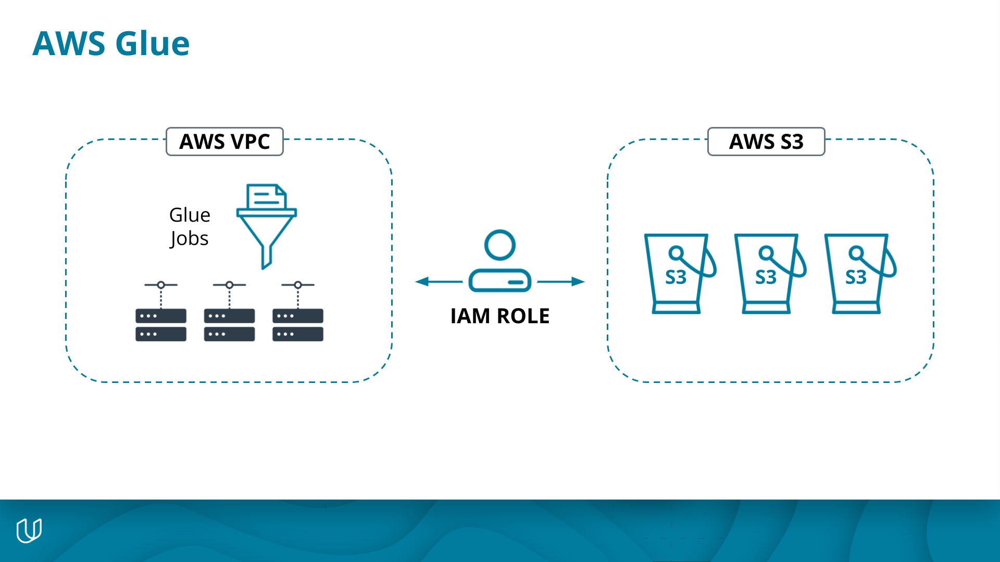

Glue Job Using S3 VPC Gateway

For AWS Glue to act on your behalf to access S3 and other resources, you need to grant access to the Glue Service by creating an IAM Service Role that can be assumed by Glue:

In [ ]:
aws iam create-role --role-name my-glue-service-role --assume-role-policy-document '{
    "Version": "2012-10-17",
    "Statement": [
        {
            "Effect": "Allow",
            "Principal": {
                "Service": "glue.amazonaws.com"
            },
            "Action": "sts:AssumeRole"
        }
    ]
}'

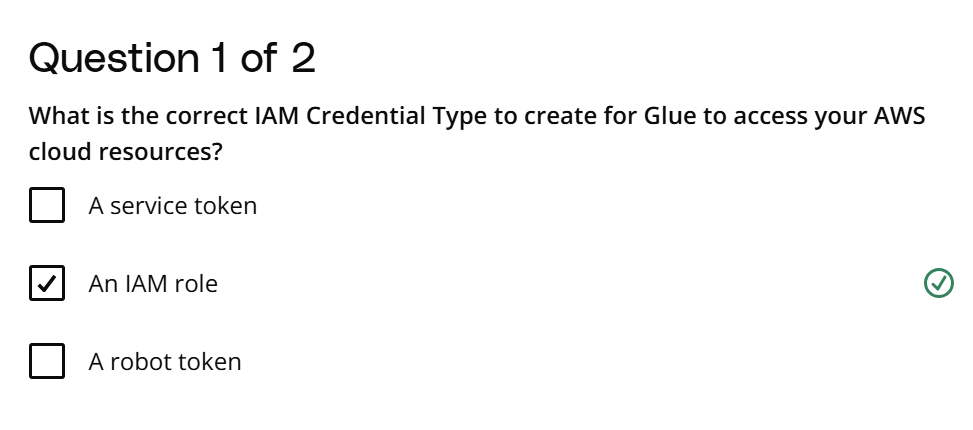

## Grant Glue Privileges on the S3 Bucket
Replace the two blanks below with the S3 bucket name you created earlier, and execute this command to allow your Glue job read/write/delete access to the bucket and everything in it. You will notice the S3 path starts with arn:aws:s3::: . An ARN is an AWS Resource Name. The format is generally:

arn:[aws/aws-cn/aws-us-gov]:[service]:[region]:[account-id]:[resource-id]


You may notice that after s3 there are three colons ::: without anything between them. That is because S3 buckets can be cross-region, and cross AWS account. For example you may wish to share data with a client, or vice versa. Setting up an S3 bucket with cross AWS account access may be necessary.

Replace the blanks in the statement below with your S3 bucket name (ex: seans-lakehouse)

In [ ]:
aws iam put-role-policy --role-name my-glue-service-role --policy-name S3Access --policy-document '{
    "Version": "2012-10-17",
    "Statement": [
        {
            "Sid": "ListObjectsInBucket",
            "Effect": "Allow",
            "Action": [
                "s3:ListBucket"
            ],
            "Resource": [
                "arn:aws:s3:::_______"
            ]
        },
        {
            "Sid": "AllObjectActions",
            "Effect": "Allow",
            "Action": "s3:*Object",
            "Resource": [
                "arn:aws:s3:::_______/*"
            ]
        }
    ]
}'

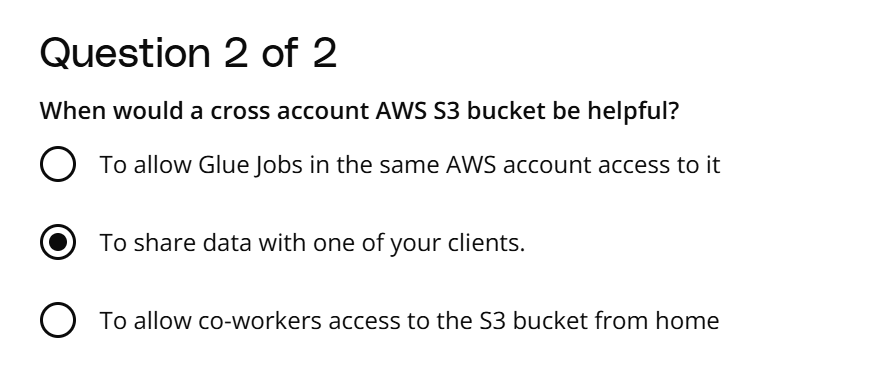

## Glue Policy
Last, we need to give Glue access to data in special S3 buckets used for Glue configuration, and several other resources. Use the following policy for general access needed by Glue:

In [ ]:
aws iam put-role-policy --role-name my-glue-service-role --policy-name GlueAccess --policy-document '{
    "Version": "2012-10-17",
    "Statement": [
        {
            "Effect": "Allow",
            "Action": [
                "glue:*",
                "s3:GetBucketLocation",
                "s3:ListBucket",
                "s3:ListAllMyBuckets",
                "s3:GetBucketAcl",
                "ec2:DescribeVpcEndpoints",
                "ec2:DescribeRouteTables",
                "ec2:CreateNetworkInterface",
                "ec2:DeleteNetworkInterface",
                "ec2:DescribeNetworkInterfaces",
                "ec2:DescribeSecurityGroups",
                "ec2:DescribeSubnets",
                "ec2:DescribeVpcAttribute",
                "iam:ListRolePolicies",
                "iam:GetRole",
                "iam:GetRolePolicy",
                "cloudwatch:PutMetricData"
            ],
            "Resource": [
                "*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "s3:CreateBucket",
                "s3:PutBucketPublicAccessBlock"
            ],
            "Resource": [
                "arn:aws:s3:::aws-glue-*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "s3:GetObject",
                "s3:PutObject",
                "s3:DeleteObject"
            ],
            "Resource": [
                "arn:aws:s3:::aws-glue-*/*",
                "arn:aws:s3:::*/*aws-glue-*/*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "s3:GetObject"
            ],
            "Resource": [
                "arn:aws:s3:::crawler-public*",
                "arn:aws:s3:::aws-glue-*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "logs:CreateLogGroup",
                "logs:CreateLogStream",
                "logs:PutLogEvents",
                "logs:AssociateKmsKey"
            ],
            "Resource": [
                "arn:aws:logs:*:*:/aws-glue/*"
            ]
        },
        {
            "Effect": "Allow",
            "Action": [
                "ec2:CreateTags",
                "ec2:DeleteTags"
            ],
            "Condition": {
                "ForAllValues:StringEquals": {
                    "aws:TagKeys": [
                        "aws-glue-service-resource"
                    ]
                }
            },
            "Resource": [
                "arn:aws:ec2:*:*:network-interface/*",
                "arn:aws:ec2:*:*:security-group/*",
                "arn:aws:ec2:*:*:instance/*"
            ]
        }
    ]
}'

## Exercise: Creating the Glue Service Role

Exercise Instructions
Follow the steps from the previous section to create the IAM Service Role Glue will assume when connecting with S3. The role defines the authorization level Glue will have in your S3 bucket.

Click LAUNCH CLOUD GATEWAY to open the AWS Console.

Solution Walkthrough

https://www.youtube.com/watch?v=p0JLEuqCpZM

## Spark Jobs

https://www.youtube.com/watch?v=-KDFsZ5yxCY

## Spark Jobs
Jupyter notebooks are great for prototyping as well as exploring and visualizing your data. However, Jupyter notebooks aren't the best tool for automating your workflow, that's where Python scripts come into play.

Imagine you work for a social media company that receives a constant stream of text, image, and video data from your users. To keep up with your users, you want your Spark jobs to run automatically at specific intervals, perhaps once every hour. These Spark jobs give your entire team the latest information on their users and will probably become so useful to your team that they will start to request more and more Spark jobs. You won't want to manually run a growing collection of notebooks, you'll want automated scripts that you can set and forget. We will be using Glue Studio to write Spark jobs that can be automated, and set to run at certain intervals.

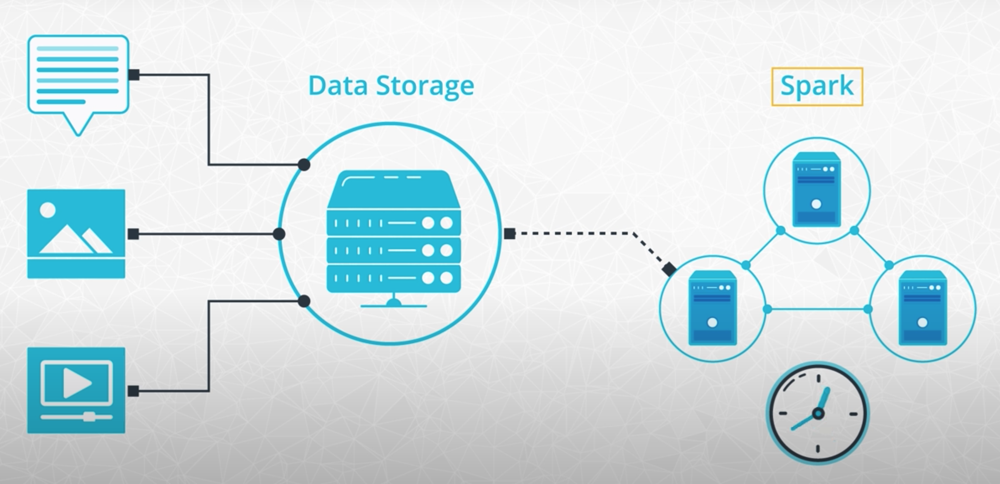

Running Spark scripts at a time interval

## Create a Spark Job using Glue Studio

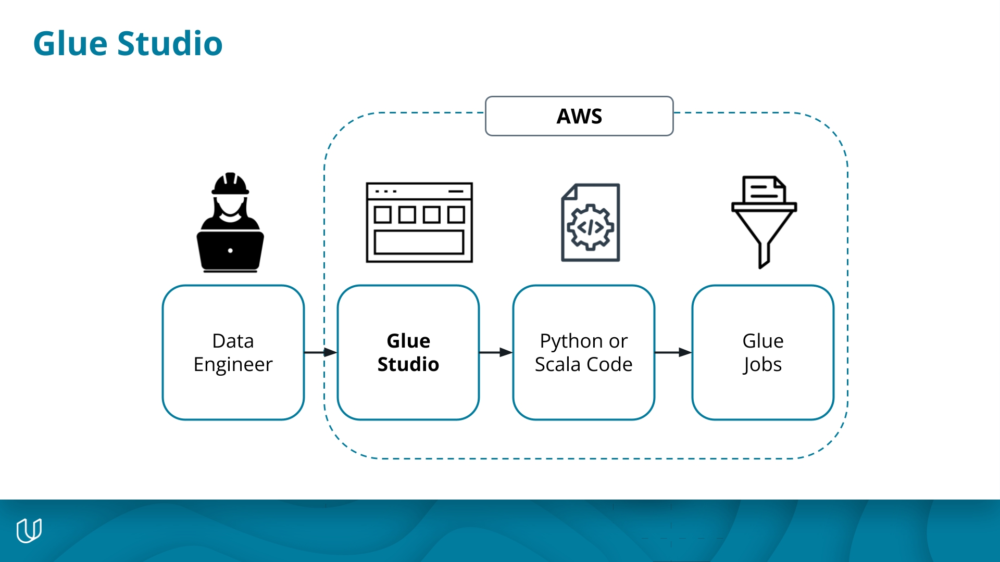

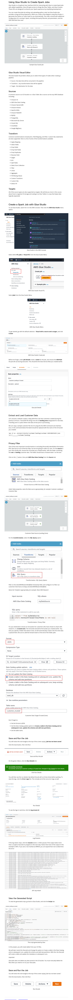

## Exercise: Define a Trusted Zone Path

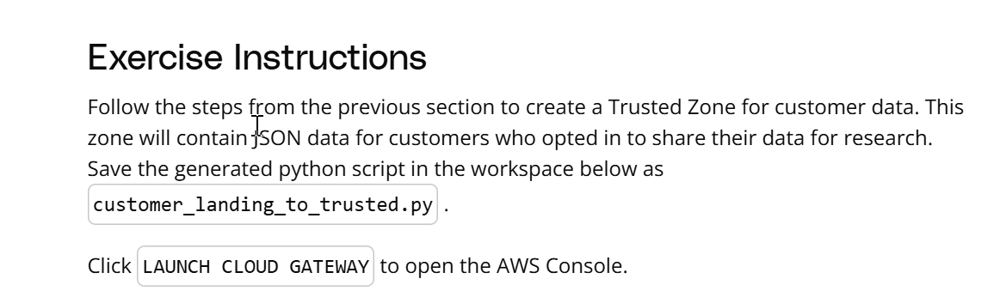

https://www.youtube.com/watch?v=F-8xb1CHH-E

https://www.youtube.com/watch?v=00rIppk9ONQ

## Storing and Retrieving Data on the Cloud

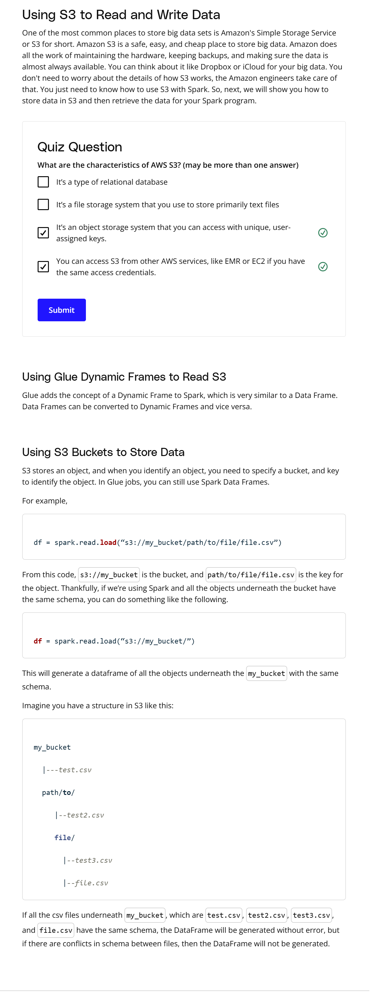

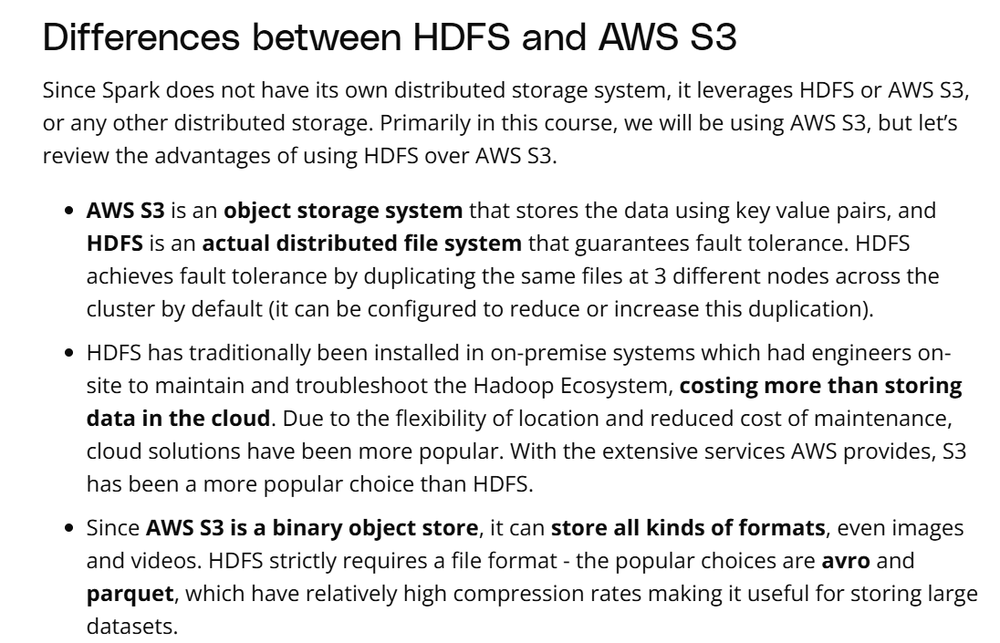

## Lesson Review

https://www.youtube.com/watch?v=E5tENHw9cqo

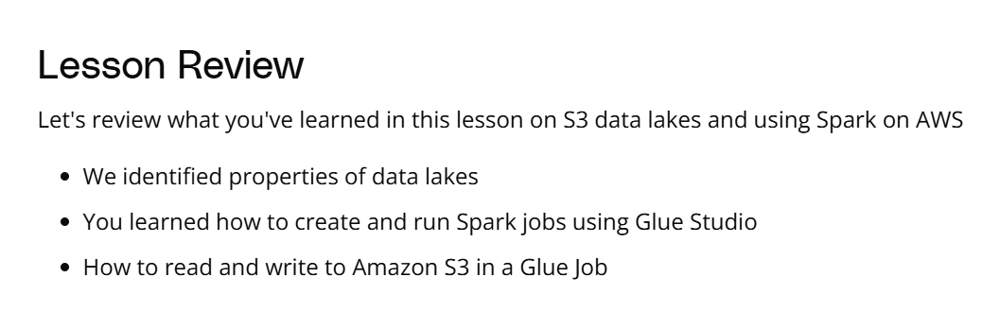
